In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%cd /content/drive/Othercomputers/MacMini/finance_preds/temp_colab

/content/drive/Othercomputers/MacMini/finance_preds/temp_colab


In [ ]:
import tensorflow as tf

from tensorflow.python.ops import resource_variable_ops
VariableSpec = resource_variable_ops.VariableSpec

from scipy.integrate import ode
from scipy.integrate import odeint

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import cm

import time
import datetime

import os

print('GPUs available on the machine:')
!nvidia-smi -L
print()

gpus = tf.config.list_physical_devices('GPU')
device = gpus[0]
tf.config.set_visible_devices(device, 'GPU')
tf.config.experimental.set_memory_growth(device, True)

print('Simulation is running on:')
print(f'device = {device}')
print()

# set data precision
data_type    = tf.float32
data_type_nn = tf.float32
tf.keras.backend.set_floatx('float32')

GPUs available on the machine:
GPU 0: NVIDIA L4 (UUID: GPU-936fc8f6-0144-64f0-1ddb-c0e071abdc32)

Simulation is running on:
device = PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')



In [ ]:
import shutil

import logging, os
logging.disable(logging.WARNING)
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

def save_nn(NN_phi, NN_eta):

    tf.keras.models.save_model(NN_phi,
                               filepath = f'{folder_name_save}/NN_phi.keras',
                               include_optimizer = False,
                               overwrite = True)

    tf.keras.models.save_model(NN_eta,
                               filepath = f'{folder_name_save}/NN_eta.keras',
                               include_optimizer = False,
                               overwrite = True)

def load_nn(folder_name_load):

    NN_phi = tf.keras.models.load_model(f'{folder_name_load}/NN_phi.keras')

    NN_eta = tf.keras.models.load_model(f'{folder_name_load}/NN_eta.keras')

    return NN_phi, NN_eta


def save_phi_exact(phi_exact):
    phi_exact_ = tf.data.Dataset.from_tensor_slices(phi_exact)
    tf.data.experimental.save(phi_exact_, f'{folder_name_save}/phi_exact')

def load_phi_exact(folder_name_load):
    tensorspec = (tf.TensorSpec(shape=None, dtype=data_type, name=None),)
    phi_loaded   = tf.data.experimental.load(f'{folder_name_load}/phi_exact', tensorspec)

    phi_exact_list = []
    for item in phi_loaded:
        phi_exact_list.append(item)

    phi_exact = tf.concat(phi_exact_list, axis=0)

    return np.array(phi_exact)

folder_name_load = f'8aug_3resblock_{datetime.datetime.now().strftime("%Y_%m_%d_%H_%M")}'
folder_name_save = folder_name_load
dirname = folder_name_load

In [ ]:
phi_df = pd.read_csv('dataTrain_8_August_2001.csv')
phi_df.head()

,Active,Option\ntype,Maturity,Strike,Moneyness,Option\nprice,Implied\nvol.,Calibrated\nvol.,Market vol. -\nCalibrated vol.
0,1,1,0.121,3800,0.677,1841.372,0.425,-1.0,1.425
1,1,2,0.121,3800,0.677,0.003,0.397,0.3,0.097
2,1,1,0.121,3900,0.695,1741.925,0.406,-1.0,1.406
3,1,2,0.121,3900,0.695,0.013,0.388,0.3,0.087
4,1,1,0.121,4000,0.712,1642.492,0.388,-1.0,1.388


In [ ]:
ids,_ = np.where(tf.reshape(tf.cast(phi_df['Option\ntype'], dtype=data_type), [-1,1]) == 1)

T_nn = tf.gather(tf.reshape(tf.cast(phi_df['Maturity'], dtype=data_type), [-1,1]), ids)
K_nn = tf.gather(tf.reshape(tf.cast(phi_df['Strike'], dtype=data_type), [-1,1]), ids)
phi_ref = tf.gather(tf.reshape(tf.cast(phi_df['Option\nprice'], dtype=data_type), [-1,1]), ids)
sigma_loc_ref = tf.gather(tf.reshape(tf.cast(phi_df['Implied\nvol.'], dtype=data_type), [-1,1]), ids)

N = 100
m = 100

S_0 = tf.constant(5614.51, dtype=data_type)
r   = tf.constant(0.04,    dtype=data_type)

# check T, K, phi_exact, S0, r
t_nn = T_nn
k_nn = tf.exp(-r*T_nn) * K_nn

print(f't_min = {tf.reduce_min(t_nn)}, t_max = {tf.reduce_max(t_nn)}, k_min = {tf.reduce_min(k_nn)}, k_max = {tf.reduce_max(k_nn)}')

t_min = 0
t_max = 1
k_min = 3400
k_max = 10000

t_tilde = t_nn / t_max
k_tilde = (k_nn - k_min) / (k_max - k_min)
phi_tilde_ref = phi_ref / S_0

save_phi_exact(phi_ref)

t_min = 0.12099999934434891, t_max = 0.8679999709129333, k_min = 3477.15283203125, k_max = 9853.08984375


In [ ]:
def net_phi_tilde():

    """
    map (T, K) to a option price phi in R+: softplus actiation
    """

    input_        = tf.keras.Input(shape=(2,))
    noisy_input_  = tf.keras.layers.GaussianNoise(0.5)(input_)
    dense_in      = tf.keras.layers.Dense(64, activation='tanh', use_bias=False)(noisy_input_)

    ######### transnet unit ############################################################################################
    dense_11      = tf.keras.layers.Dense(64, use_bias=False)(dense_in)
    batchnorm_11  = tf.keras.layers.BatchNormalization()(dense_11)
    activation_11 = tf.keras.layers.Activation('tanh')(batchnorm_11)

    dense_12      = tf.keras.layers.Dense(64, use_bias=False)(activation_11)
    batchnorm_12  = tf.keras.layers.BatchNormalization()(dense_12)
    activation_12 = tf.keras.layers.Activation('tanh')(batchnorm_12)

    added_1 = tf.keras.layers.Add()([dense_in, activation_12])
    ####################################################################################################################

    ######### transnet unit ############################################################################################
    dense_21      = tf.keras.layers.Dense(64, use_bias=False)(added_1)
    batchnorm_21  = tf.keras.layers.BatchNormalization()(dense_21)
    activation_21 = tf.keras.layers.Activation('tanh')(batchnorm_21)

    dense_22      = tf.keras.layers.Dense(64, use_bias=False)(activation_21)
    batchnorm_22  = tf.keras.layers.BatchNormalization()(dense_22)
    activation_22 = tf.keras.layers.Activation('tanh')(batchnorm_22)

    added_2 = tf.keras.layers.Add()([added_1, activation_22])
    ####################################################################################################################

    ######### transnet unit ############################################################################################
    dense_31      = tf.keras.layers.Dense(64, use_bias=False)(added_2)
    batchnorm_31  = tf.keras.layers.BatchNormalization()(dense_31)
    activation_31 = tf.keras.layers.Activation('tanh')(batchnorm_31)

    dense_32      = tf.keras.layers.Dense(64, use_bias=False)(activation_31)
    batchnorm_32  = tf.keras.layers.BatchNormalization()(dense_32)
    activation_32 = tf.keras.layers.Activation('tanh')(batchnorm_32)

    added_3 = tf.keras.layers.Add()([added_2, activation_32])
    ####################################################################################################################

    # ######### transnet unit ############################################################################################
    # dense_41      = tf.keras.layers.Dense(64, use_bias=False)(added_3)
    # batchnorm_41  = tf.keras.layers.BatchNormalization()(dense_41)
    # activation_41 = tf.keras.layers.Activation('tanh')(batchnorm_41)

    # dense_42      = tf.keras.layers.Dense(64, use_bias=False)(activation_41)
    # batchnorm_42  = tf.keras.layers.BatchNormalization()(dense_42)
    # activation_42 = tf.keras.layers.Activation('tanh')(batchnorm_42)

    # added_4 = tf.keras.layers.Add()([added_1, activation_42])
    # ####################################################################################################################

    # ######### transnet unit ############################################################################################
    # dense_51      = tf.keras.layers.Dense(64, use_bias=False)(added_4)
    # batchnorm_51  = tf.keras.layers.BatchNormalization()(dense_51)
    # activation_51 = tf.keras.layers.Activation('tanh')(batchnorm_51)

    # dense_52      = tf.keras.layers.Dense(64, use_bias=False)(activation_51)
    # batchnorm_52  = tf.keras.layers.BatchNormalization()(dense_52)
    # activation_52 = tf.keras.layers.Activation('tanh')(batchnorm_52)

    # added_5 = tf.keras.layers.Add()([added_4, activation_52])
    # ####################################################################################################################

    dense_out = tf.keras.layers.Dense(64, activation='tanh', use_bias=True)(added_3)

    output_ = tf.keras.layers.Dense(1, activation='softplus', use_bias=True, dtype=data_type_nn)(dense_out)

    model   = tf.keras.models.Model(inputs=input_, outputs=output_)

    return model


def net_eta_tilde():

    """
    map (T, K) to local volatility sigma in R+: softplus actiation
    """

    input_        = tf.keras.Input(shape=(2,))
    noisy_input_  = tf.keras.layers.GaussianNoise(0.5)(input_)
    dense_in      = tf.keras.layers.Dense(64, activation='tanh', use_bias=False)(noisy_input_)

    ######### transnet unit ############################################################################################
    dense_11      = tf.keras.layers.Dense(64, use_bias=False)(dense_in)
    batchnorm_11  = tf.keras.layers.BatchNormalization()(dense_11)
    activation_11 = tf.keras.layers.Activation('tanh')(batchnorm_11)

    dense_12      = tf.keras.layers.Dense(64, use_bias=False)(activation_11)
    batchnorm_12  = tf.keras.layers.BatchNormalization()(dense_12)
    activation_12 = tf.keras.layers.Activation('tanh')(batchnorm_12)

    added_1 = tf.keras.layers.Add()([dense_in, activation_12])
    ####################################################################################################################

    ######### transnet unit ############################################################################################
    dense_21      = tf.keras.layers.Dense(64, use_bias=False)(added_1)
    batchnorm_21  = tf.keras.layers.BatchNormalization()(dense_21)
    activation_21 = tf.keras.layers.Activation('tanh')(batchnorm_21)

    dense_22      = tf.keras.layers.Dense(64, use_bias=False)(activation_21)
    batchnorm_22  = tf.keras.layers.BatchNormalization()(dense_22)
    activation_22 = tf.keras.layers.Activation('tanh')(batchnorm_22)

    added_2 = tf.keras.layers.Add()([added_1, activation_22])
    ####################################################################################################################

    ######### transnet unit ############################################################################################
    dense_31      = tf.keras.layers.Dense(64, use_bias=False)(added_2)
    batchnorm_31  = tf.keras.layers.BatchNormalization()(dense_31)
    activation_31 = tf.keras.layers.Activation('tanh')(batchnorm_31)

    dense_32      = tf.keras.layers.Dense(64, use_bias=False)(activation_31)
    batchnorm_32  = tf.keras.layers.BatchNormalization()(dense_32)
    activation_32 = tf.keras.layers.Activation('tanh')(batchnorm_32)

    added_3 = tf.keras.layers.Add()([added_2, activation_32])
    ####################################################################################################################

    # ######### transnet unit ############################################################################################
    # dense_41      = tf.keras.layers.Dense(64, use_bias=False)(added_3)
    # batchnorm_41  = tf.keras.layers.BatchNormalization()(dense_41)
    # activation_41 = tf.keras.layers.Activation('tanh')(batchnorm_41)

    # dense_42      = tf.keras.layers.Dense(64, use_bias=False)(activation_41)
    # batchnorm_42  = tf.keras.layers.BatchNormalization()(dense_42)
    # activation_42 = tf.keras.layers.Activation('tanh')(batchnorm_42)

    # added_4 = tf.keras.layers.Add()([added_1, activation_42])
    # ####################################################################################################################

    # ######### transnet unit ############################################################################################
    # dense_51      = tf.keras.layers.Dense(64, use_bias=False)(added_4)
    # batchnorm_51  = tf.keras.layers.BatchNormalization()(dense_51)
    # activation_51 = tf.keras.layers.Activation('tanh')(batchnorm_51)

    # dense_52      = tf.keras.layers.Dense(64, use_bias=False)(activation_51)
    # batchnorm_52  = tf.keras.layers.BatchNormalization()(dense_52)
    # activation_52 = tf.keras.layers.Activation('tanh')(batchnorm_52)

    # added_5 = tf.keras.layers.Add()([added_4, activation_52])
    # ####################################################################################################################

    dense_out = tf.keras.layers.Dense(64, activation='tanh', use_bias=True)(added_3)

    output_ = tf.keras.layers.Dense(1, activation='softplus', use_bias=True, dtype=data_type_nn)(dense_out)

    model   = tf.keras.models.Model(inputs=input_, outputs=output_)

    return model

In [ ]:
NN_phi_tilde = net_phi_tilde()
NN_eta_tilde = net_eta_tilde()

def neural_phi_tilde(t_tilde, k_tilde):

    phi_nn_ = NN_phi_tilde(tf.concat([t_tilde, k_tilde], axis=1))

    return phi_nn_

def neural_eta_tilde(t_tilde, k_tilde):

    eta_nn_ = NN_eta_tilde(tf.concat([t_tilde, k_tilde], axis=1))

    return eta_nn_

def neural_phi(T, K):

    T_nn = tf.cast(tf.reshape(T, [-1,1]), dtype=data_type)
    K_nn = tf.cast(tf.reshape(K, [-1,1]), dtype=data_type)

    t_nn = T_nn
    k_nn = tf.exp(-r*T_nn) * K_nn

    t_tilde = t_nn / t_max
    k_tilde = (k_nn - k_min) / (k_max - k_min)

    phi_nn_ = S_0 * NN_phi_tilde(tf.concat([t_tilde, k_tilde], axis=1))

    return phi_nn_


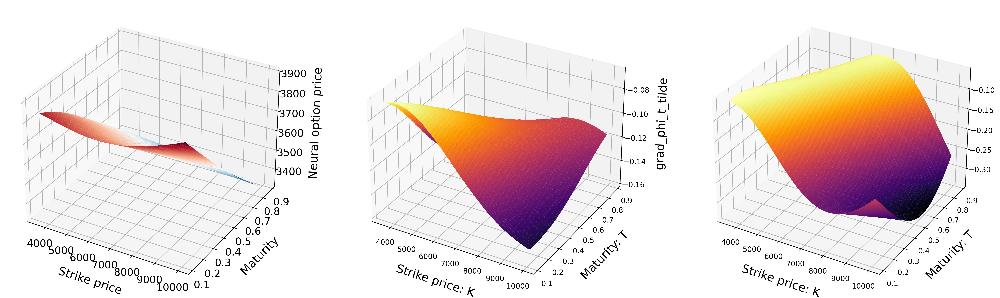

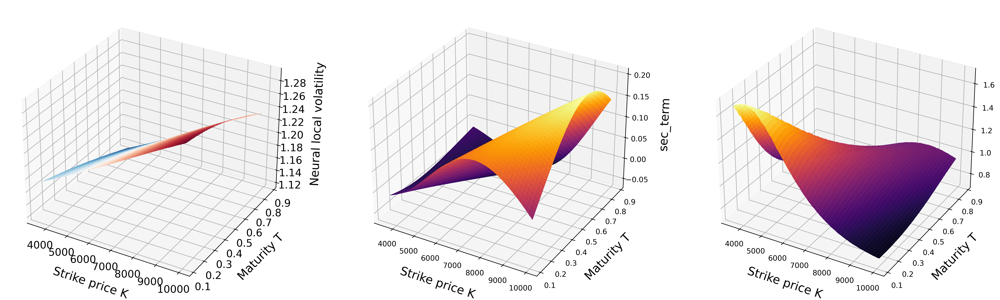

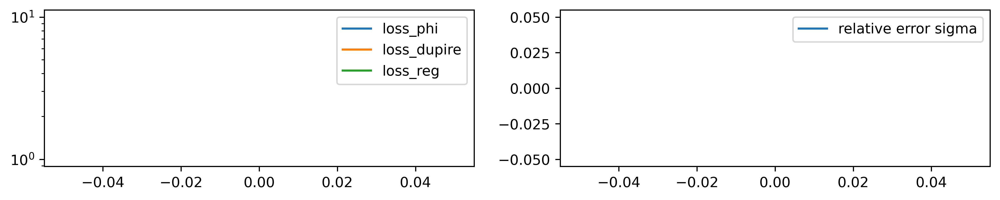

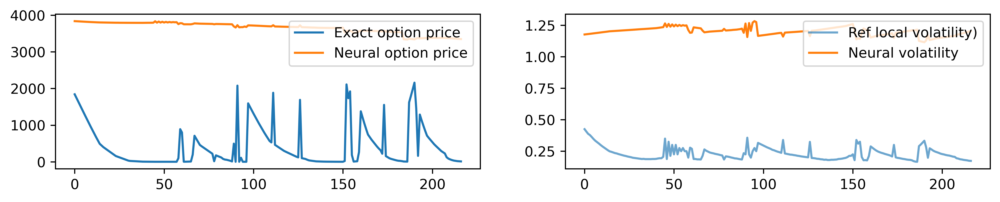

In [ ]:
def plot_res(loss_phi_list, loss_dupire_list, loss_reg_list, error_sigma_list, step):

    # generating grid for plotting
    T_min = tf.reduce_min(T_nn)
    T_max = tf.reduce_max(T_nn)
    K_min = tf.reduce_min(K_nn)
    K_max = tf.reduce_max(K_nn)

    T_ = tf.reshape(tf.repeat(tf.reshape(tf.cast(np.linspace(T_min, T_max, N), dtype=data_type), [-1,1]), m, axis=1), [-1,1])
    K_ = tf.reshape(tf.repeat(tf.reshape(tf.cast(np.linspace(K_min, K_max, m), dtype=data_type), [1,-1]), N, axis=0), [-1,1])

    T_nn_ = tf.reshape(T_, [-1,1])
    K_nn_ = tf.reshape(K_, [-1,1])

    t_nn_ = T_nn_
    k_nn_ = tf.exp(-r*T_nn_) * K_nn_

    t_tilde_ =  t_nn_ / t_max
    k_tilde_ = (k_nn_ - k_min) / (k_max - k_min)

    phi_tilde_ = neural_phi_tilde(t_tilde_, k_tilde_)
    sigma_nn_ = tf.sqrt(2*neural_eta_tilde(t_tilde_, k_tilde_)/ (t_max - t_min))

    with tf.GradientTape(persistent=True) as tape_2:
        tape_2.watch(k_tilde_)
        with tf.GradientTape(persistent=True) as tape_1:
            tape_1.watch(t_tilde_)
            tape_1.watch(k_tilde_)

            phi_tilde_ = neural_phi_tilde(t_tilde_, k_tilde_)

        grad_phi_t_tilde = tape_1.gradient(phi_tilde_, t_tilde_)
        grad_phi_k_tilde = tape_1.gradient(phi_tilde_, k_tilde_)

    grad_phi_kk_tilde = tape_2.gradient(grad_phi_k_tilde, k_tilde_)

    eta_tilde_ = neural_eta_tilde(t_tilde_, k_tilde_)

    sec_term = eta_tilde_ * (k_min / (k_max - k_min) + k_tilde_)**2 * grad_phi_kk_tilde

    dupire_eqn_error = grad_phi_t_tilde - sec_term

    ############################################################################################################################

    fig = plt.figure(figsize=[24,8], dpi = 450)

    # plot neural option price
    phi_nn_ = S_0 * neural_phi_tilde(t_tilde_, k_tilde_)

    ax1 = fig.add_subplot(131, projection='3d')
    ax1.plot_surface(tf.reshape(K_nn_, [N,m]), tf.reshape(T_nn_, [N,m]), tf.reshape(phi_nn_, [N,m]), cmap = plt.cm.RdBu_r)
    ax1.tick_params(axis='x', labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)
    ax1.tick_params(axis='z', labelsize=14)
    ax1.set_xlabel('Strike price', labelpad = 12, fontsize=16)
    ax1.set_ylabel('Maturity', labelpad = 12, fontsize=16)
    ax1.set_zlabel('Neural option price', labelpad = 12, fontsize=16)

    ax_2 = fig.add_subplot(1,3,2, projection='3d')
    ax_2.plot_surface(tf.reshape(K_nn_, [N,m]), tf.reshape(T_nn_, [N,m]), tf.reshape(grad_phi_t_tilde, [N,m]), cmap=cm.inferno,linewidth=0)
    ax_2.set_ylabel('Maturity: T', labelpad = 12, fontsize=16)
    ax_2.set_xlabel('Strike price: K', labelpad = 12, fontsize=16)
    ax_2.set_zlabel('grad_phi_t_tilde', labelpad = 12, fontsize=16)

    ax_3 = fig.add_subplot(1,3,3, projection='3d')
    ax_3.plot_surface(tf.reshape(K_nn_, [N,m]), tf.reshape(T_nn_, [N,m]), tf.reshape(dupire_eqn_error, [N,m]), cmap=cm.inferno,linewidth=0)
    ax_3.set_ylabel('Maturity: T', labelpad = 12, fontsize=16)
    ax_3.set_xlabel('Strike price: K', labelpad = 12, fontsize=16)
    ax_3.set_zlabel('dupire_eqn_error', labelpad = 12, fontsize=16)
    plt.savefig(os.path.join(dirname, f'phi_{step}.png'))
    plt.show()

    fig = plt.figure(figsize=[24,8], dpi = 450)

    # plot neural local volatility
    sigma_nn_ = tf.sqrt(2*neural_eta_tilde(t_tilde_, k_tilde_)/t_max)

    ax1 = fig.add_subplot(131, projection='3d')
    ax1.plot_surface(tf.reshape(K_nn_, [N,m]), tf.reshape(T_nn_, [N,m]), tf.reshape(sigma_nn_, [N,m]), cmap = plt.cm.RdBu_r)
    ax1.tick_params(axis='x', labelsize=14)
    ax1.tick_params(axis='y', labelsize=14)
    ax1.tick_params(axis='z', labelsize=14)
    ax1.set_xlabel('Strike price K', labelpad = 12, fontsize=16)
    ax1.set_ylabel('Maturity T', labelpad = 12, fontsize=16)
    ax1.set_zlabel('Neural local volatility', labelpad = 12, fontsize=16)

    ax_2 = fig.add_subplot(1,3,2, projection='3d')
    ax_2.plot_surface(tf.reshape(K_nn_, [N,m]), tf.reshape(T_nn_, [N,m]), tf.reshape(sec_term, [N,m]), cmap=cm.inferno,linewidth=0)
    ax_2.set_ylabel('Maturity T', labelpad = 12, fontsize=16)
    ax_2.set_xlabel('Strike price K', labelpad = 12, fontsize=16)
    ax_2.set_zlabel('sec_term', labelpad = 12, fontsize=16)

    weight_surf = tf.clip_by_value(tf.stop_gradient(tf.reduce_mean(tf.abs(grad_phi_t_tilde))/tf.abs(grad_phi_t_tilde)),
                                   clip_value_min=0.1, clip_value_max=10)

    ax_3 = fig.add_subplot(1,3,3, projection='3d')
    ax_3.plot_surface(tf.reshape(K_nn_, [N,m]), tf.reshape(T_nn_, [N,m]), tf.reshape(weight_surf , [N,m]), cmap=cm.inferno,linewidth=0)
    ax_3.set_ylabel('Maturity T', labelpad = 12, fontsize=16)
    ax_3.set_xlabel('Strike price K', labelpad = 12, fontsize=16)
    ax_3.set_zlabel('weight_surf', labelpad = 12, fontsize=16)
    plt.savefig(os.path.join(dirname, f'eta_{step}.png'))
    plt.show()


    fig, ax = plt.subplots(1,2, figsize=[12,2], dpi=450)

    ax[0].semilogy(loss_phi_list, label='loss_phi')
    ax[0].semilogy(loss_dupire_list, label='loss_dupire')
    ax[0].semilogy(loss_reg_list, label='loss_reg')
    ax[0].legend(loc='upper right')

    ax[1].plot(error_sigma_list, label='relative error sigma')
    ax[1].legend(loc='upper right')
    plt.savefig(os.path.join(dirname, f'losses_{step}.png'))
    plt.show()

    fig, ax = plt.subplots(1,2, figsize=[12,2], dpi=450)

    ax[0].plot(S_0 * phi_tilde_ref, label='Exact option price')
    ax[0].plot(S_0 * neural_phi_tilde(t_tilde, k_tilde), label='Neural option price')
    ax[0].legend(loc='upper right')

    ax[1].plot(sigma_loc_ref, label=f'Ref local volatility)', alpha=0.65)
    ax[1].plot(tf.sqrt(2*neural_eta_tilde(t_tilde, k_tilde)/ t_max), label=f'Neural volatility')
    ax[1].legend(loc='upper right')
    plt.savefig(os.path.join(dirname, f'lossescomparison_{step}.png'))
    plt.show()

plot_res([], [], [], [], -1)

In [ ]:
def loss_phi_cal():

    phi_tilde_nn = neural_phi_tilde(t_tilde, k_tilde)

    weight_1 = tf.clip_by_value(tf.stop_gradient(tf.reduce_mean(tf.abs(phi_tilde_ref))/tf.abs(phi_tilde_ref)),
                               clip_value_min=0.1, clip_value_max=10)

    loss_phi_ = tf.reduce_mean(weight_1 * tf.square(phi_tilde_nn - phi_tilde_ref))

    # impose boundary condition
    t_tilde_0 = tf.cast(tf.reshape(np.full(128, 0), [-1,1]), dtype=data_type)
    k_tilde_0 = tf.random.uniform(shape = [128, 1], minval=0, maxval=1, dtype=data_type)

    phi_tilde_0 = tf.nn.relu(1 - (1/S_0) * tf.exp(r*t_max*t_tilde_0) * (k_min + (k_max - k_min)*k_tilde_0))

    weight_2 = tf.clip_by_value(tf.stop_gradient(tf.reduce_mean(tf.abs(phi_tilde_0))/tf.abs(phi_tilde_0)),
                                clip_value_min=0.1, clip_value_max=10)

    loss_bc_ = tf.reduce_mean(weight_2*tf.square((neural_phi_tilde(t_tilde_0, k_tilde_0) - phi_tilde_0)))

    return loss_phi_ + loss_bc_

time_0 = time.time()
loss_phi = loss_phi_cal()
time_1 = time.time()

print(f'loss_phi = {loss_phi}, computation time = {time_1 - time_0}')

loss_phi = 5.2057785987854, computation time = 0.24394941329956055


In [ ]:
def loss_dupire_cal():

    t_tilde_0 = tf.cast(tf.reshape(np.full(128, 0), [-1,1]), dtype=data_type)
    t_tilde_1 = tf.cast(tf.reshape(np.full(128, 1), [-1,1]), dtype=data_type)
    k_tilde_0 = tf.cast(tf.reshape(np.full(128, 0), [-1,1]), dtype=data_type)
    k_tilde_1 = tf.cast(tf.reshape(np.full(128, 1), [-1,1]), dtype=data_type)
    t_tilde_bulk = tf.random.uniform(shape = [128*128, 1], minval=0, maxval=1, dtype=data_type)
    k_tilde_bulk = tf.random.uniform(shape = [128*128, 1], minval=0, maxval=1, dtype=data_type)

    t_tilde_random = tf.concat([t_tilde_0, t_tilde_1, t_tilde_bulk], axis=0)
    k_tilde_random = tf.concat([k_tilde_bulk, k_tilde_0, k_tilde_1], axis=0)

    with tf.GradientTape(persistent=True) as tape_2:
        tape_2.watch(k_tilde_random)
        with tf.GradientTape(persistent=True) as tape_1:
            tape_1.watch(t_tilde_random)
            tape_1.watch(k_tilde_random)

            phi_tilde_ = neural_phi_tilde(t_tilde_random, k_tilde_random)

        grad_phi_t_tilde = tape_1.gradient(phi_tilde_, t_tilde_random)
        grad_phi_k_tilde = tape_1.gradient(phi_tilde_, k_tilde_random)

    grad_phi_kk_tilde = tape_2.gradient(grad_phi_k_tilde, k_tilde_random)

    eta_tilde_ = neural_eta_tilde(t_tilde_random, k_tilde_random)

    dupire_eqn = grad_phi_t_tilde - eta_tilde_ * (k_min / (k_max - k_min) + k_tilde_random)**2 * grad_phi_kk_tilde

    weight_ = tf.clip_by_value(tf.stop_gradient(tf.reduce_mean(tf.abs(grad_phi_t_tilde))/tf.abs(grad_phi_t_tilde)),
                               clip_value_min=0.1, clip_value_max=10)

    loss_dupire_ = tf.reduce_mean(weight_ * tf.square(dupire_eqn))

    loss_reg_ = tf.reduce_mean(weight_ * tf.nn.relu(-grad_phi_t_tilde * grad_phi_kk_tilde))
    # loss_reg_ = 0

    return loss_dupire_, loss_reg_

time_0 = time.time()
loss_dupire, loss_reg = loss_dupire_cal()
time_1 = time.time()

print(f'loss_dupire = {loss_dupire}, loss_reg = {loss_reg}, computation time = {time_1 - time_0}')

loss_dupire = 0.031876299530267715, loss_reg = 0.006288646720349789, computation time = 0.10672736167907715


In [ ]:
optimizer_NN_phi = tf.keras.optimizers.Adam(learning_rate = 10**-4)
optimizer_NN_eta = tf.keras.optimizers.Adam(learning_rate = 10**-4)

lambda_pde = tf.constant(0.1, dtype=data_type)
lambda_reg = tf.constant(0.1, dtype=data_type)

@tf.function
def train_step(lambda_pde, lambda_reg):

    with tf.GradientTape(persistent=True) as tape:

        loss_phi    = loss_phi_cal()
        loss_dupire, loss_reg = loss_dupire_cal()

        loss_total = loss_phi + lambda_pde*loss_dupire + lambda_reg*loss_reg

    # calculate raw gradients
    grads_NN_phi = tape.gradient(loss_total,  NN_phi_tilde.trainable_variables)
    grads_NN_eta = tape.gradient(loss_dupire, NN_eta_tilde.trainable_variables)

    # use clipped gradients to perform gradient descent
    optimizer_NN_phi.apply_gradients( zip(grads_NN_phi, NN_phi_tilde.trainable_variables) )
    optimizer_NN_eta.apply_gradients( zip(grads_NN_eta, NN_eta_tilde.trainable_variables) )

    return loss_phi, loss_dupire, loss_reg

time_0 = time.time()
loss_phi, loss_dupire, loss_reg = train_step(lambda_pde, lambda_reg)
time_1 = time.time()

print(f'computation time = {time_1 - time_0}')
print(f'loss_phi = {loss_phi}, loss_dupire = {loss_dupire}, loss_reg = {loss_reg}')
print()

time_0 = time.time()
loss_phi, loss_dupire, loss_reg = train_step(lambda_pde, lambda_reg)
time_1 = time.time()

print(f'computation time = {time_1 - time_0}')
print(f'loss_phi = {loss_phi}, loss_dupire = {loss_dupire}, loss_reg = {loss_reg}')
print()

computation time = 9.767084836959839
loss_phi = 5.648397445678711, loss_dupire = 0.0321836844086647, loss_reg = 0.006340771447867155

computation time = 0.01683640480041504
loss_phi = 4.776665687561035, loss_dupire = 0.03645488992333412, loss_reg = 0.00784111488610506



In [ ]:
learning_rate = 10**-3

optimizer_NN_phi.learning_rate.assign(learning_rate)
optimizer_NN_eta.learning_rate.assign(learning_rate/4)

loss_phi_list     = []
loss_dupire_list  = []
loss_reg_list     = []

error_sigma_list  = []
rmse_sigma_list   = []

lambda_pde = tf.constant(1.0, dtype=data_type)
lambda_reg = tf.constant(1.0, dtype=data_type)

for iter_ in range(50001):

    loss_phi, loss_dupire, loss_reg = train_step(lambda_pde, lambda_reg)

    loss_phi_list.append(loss_phi)
    loss_dupire_list.append(loss_dupire)
    loss_reg_list.append(loss_reg)

    # compute the relative error of neural local volatility
    sigma_exact_ = sigma_loc_ref
    sigma_nn_ = tf.sqrt(2*neural_eta_tilde(t_tilde, k_tilde)/t_max)
    error_sigma = tf.reduce_mean(tf.abs(sigma_exact_ - sigma_nn_) / sigma_exact_)
    rmse_sigma  = tf.sqrt(tf.reduce_mean(tf.square(1 - sigma_nn_ / sigma_exact_)))
    error_sigma_list.append(error_sigma)
    rmse_sigma_list.append(rmse_sigma)

    if iter_ % 2500 ==0:

        rmse_fit = tf.sqrt(tf.reduce_mean(tf.square(neural_phi(T_nn, K_nn) - phi_ref)))

        print(f'iter = {iter_}, lambda = {lambda_pde}: loss_phi = {loss_phi_list[-1]}, loss_dupire = {loss_dupire_list[-1]}, error_sigma = {error_sigma_list[-1]}, rmse_fit = {rmse_fit}')

    if iter_ % 2000 == 0 and iter_ != 0:

        learning_rate /= 1.1

        optimizer_NN_phi.learning_rate.assign(learning_rate)
        optimizer_NN_eta.learning_rate.assign(learning_rate/4)

    if iter_ % 10000 == 0:
        plot_res(loss_phi_list, loss_dupire_list, loss_reg_list, error_sigma_list, iter_)

In [ ]:
print(f'relative rmse at the end of the training = {rmse_sigma_list[-1] }')
print(f'smallest relative rmse during the training = {tf.reduce_min(rmse_sigma_list) }')

print(f'relative error at the end of the training = {error_sigma_list[-1] }')
print(f'smallest relative error during the training = {tf.reduce_min(error_sigma_list) }')

# save model at the end of the training
save_nn(NN_phi_tilde, NN_eta_tilde)

relative rmse at the end of the training = 0.26228466629981995
smallest relative rmse during the training = 0.11810795217752457
relative error at the end of the training = 0.17439815402030945
smallest relative error during the training = 0.08750643581151962


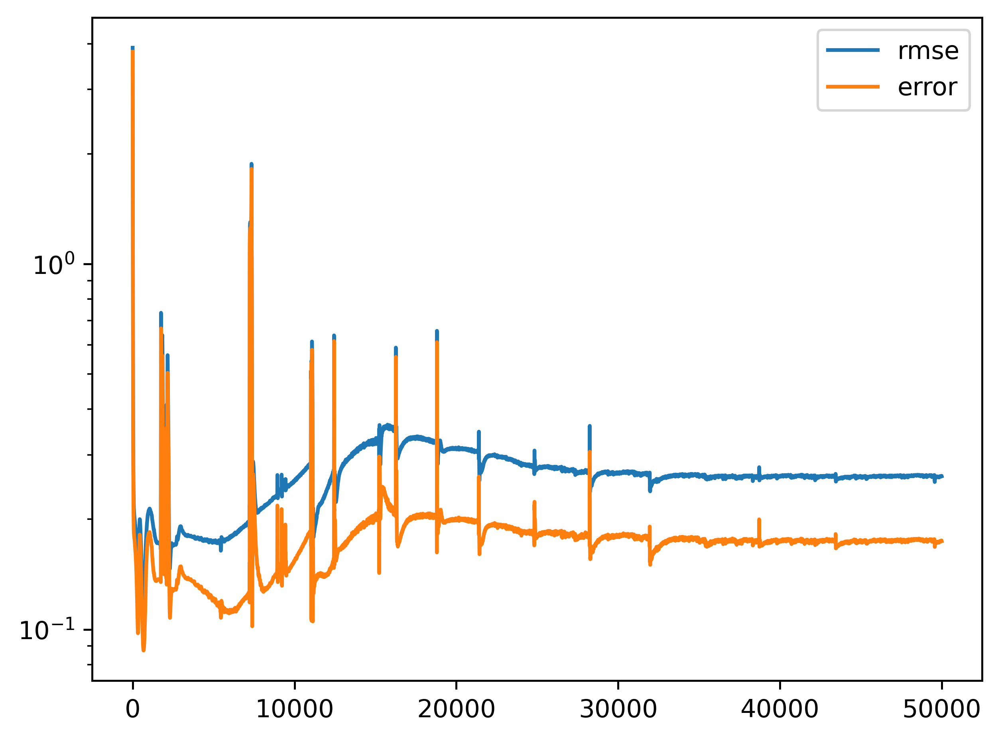

In [ ]:
fig = plt.figure(dpi=450)

plt.semilogy(rmse_sigma_list, label='rmse')
plt.semilogy(error_sigma_list, label='error')
plt.legend(loc='upper right')
plt.show()

In [ ]:
rmse_fit = tf.sqrt(tf.reduce_mean(tf.square(neural_phi(T_nn, K_nn) - phi_ref)))
print(f'rmse_fit = {rmse_fit}')

rmse_fit = 3.478304624557495


In [ ]:
# load neural networks
NN_phi_tilde, NN_eta_tilde = load_nn(folder_name_load)

phi_df = pd.read_csv('dataTrain_8_August_2001.csv')

ids,_ = np.where(tf.reshape(tf.cast(phi_df['Option\ntype'], dtype=data_type), [-1,1]) == 1)

T_ref = tf.gather(tf.reshape(tf.cast(phi_df['Maturity'], dtype=data_type), [-1,1]), ids)
K_ref = tf.gather(tf.reshape(tf.cast(phi_df['Strike'], dtype=data_type), [-1,1]), ids)
phi_ref = tf.gather(tf.reshape(tf.cast(phi_df['Option\nprice'], dtype=data_type), [-1,1]), ids)

In [ ]:
def neural_eta_tilde(t_tilde, k_tilde):

    eta_nn_ = NN_eta_tilde(tf.concat([t_tilde, k_tilde], axis=1))

    return eta_nn_

def neural_sigma(T, K):

    T_nn = tf.cast(tf.reshape(T, [-1,1]), dtype=data_type)
    K_nn = tf.cast(tf.reshape(K, [-1,1]), dtype=data_type)

    t_nn = T_nn
    k_nn = tf.exp(-r*T_nn) * K_nn

    t_tilde = t_nn / t_max
    k_tilde = (k_nn - k_min) / (k_max - k_min)

    sigma_nn = tf.sqrt(2*neural_eta_tilde(t_tilde, k_tilde)/t_max)

    return tf.squeeze(sigma_nn)

def neural_phi(T, K):

    T_nn = tf.cast(tf.reshape(T, [-1,1]), dtype=data_type)
    K_nn = tf.cast(tf.reshape(K, [-1,1]), dtype=data_type)

    t_nn = T_nn
    k_nn = tf.exp(-r*T_nn) * K_nn

    t_tilde = t_nn / t_max
    k_tilde = (k_nn - k_min) / (k_max - k_min)

    phi_nn_ = S_0 * NN_phi_tilde(tf.concat([t_tilde, k_tilde], axis=1))

    return phi_nn_

S_t obtained by solving local volatility SDE M = 100000 times from t = [0, 1.0], computation time = 5.765090465545654


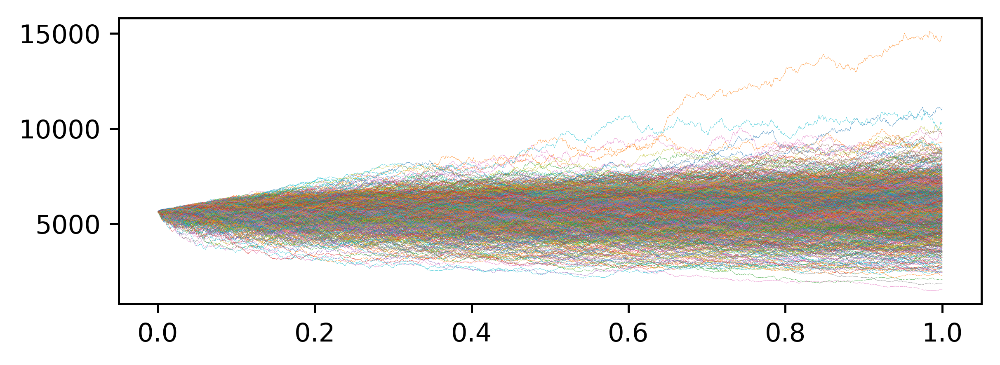

In [ ]:
# short interest rate
r = tf.constant(0.04, dtype=data_type)
# dimension of the random variable
d  = 1
# number of samples
M  = 10**5
# number of time steps
N_t  = 1000
# size of time step
dt = 0.001

t_min = 0
t_max = 1
k_min = 3400
k_max = 10000

S_0 = tf.reshape(tf.constant([5614.51], dtype=data_type), [-1,1])

# exclude 0
t_all = tf.cast(tf.reshape(np.linspace(0, N_t*dt, N_t), [-1,1]), dtype=data_type)

S_list = [tf.cast(tf.reshape(np.full(M, S_0[0]), [1,M]), dtype=data_type)]

dW_list = tf.cast(tf.concat([np.random.normal(0,1, size=[N_t,1]) * np.sqrt(dt) for i in range(M)], axis=1), dtype=data_type)

@tf.function
def S_next_cal(t_now, S_now, dW_now):
    S_new = S_now + r * S_now * dt + neural_sigma(t_now, S_now) * S_now * dW_now
    return S_new

time_0 = time.time()

for i in range(N_t-1):
    t_now  = tf.repeat(t_all[i], M, axis=0)
    S_now  = S_list[-1]
    dW_now = dW_list[i]

    S_new = S_next_cal(t_now, S_now, dW_now)

    S_list.append(S_new)

S_matrix = tf.concat(S_list, axis=0)

time_1 = time.time()

print(f'S_t obtained by solving local volatility SDE M = {M} times from t = [0, {N_t*dt}], computation time = {time_1 - time_0}')

fig, ax = plt.subplots(figsize=[6, 2], dpi = 450)
plt.plot(t_all, S_matrix[:,:1024], lw='0.1')
plt.show()

In [ ]:
# Consider m strikes per maturity
N = 800
m = 100

T = tf.repeat(tf.reshape(t_all[100:900], [-1,1]), m, axis=1)
K = tf.cast(tf.repeat(tf.reshape(np.linspace(3600, 10000, m), [1,-1]), len(T), axis=0), dtype=data_type)

T_nn = tf.reshape(T, [-1,1])
K_nn = tf.reshape(K, [-1,1])

t_nn = T_nn
k_nn = tf.exp(-r*T_nn) * K_nn

t_tilde = t_nn / t_max
k_tilde = (k_nn - k_min) / (k_max - k_min)

S_T = S_matrix

def phi_cal(T, K):
    """
    compute option price per maturity-strike pair
    """

    # Monte-Carlo estiation for the expectation
    E_ = tf.concat([tf.reshape(tf.reduce_mean(tf.nn.relu(tf.expand_dims(S_T[i], axis=0) -
                                                         tf.expand_dims(K[i], axis=1)), axis=1), [1,-1]) for i in range(N)], axis=0)

    phi_ = tf.exp(-r * T) * E_

    return phi_

neural phi from curve fitting


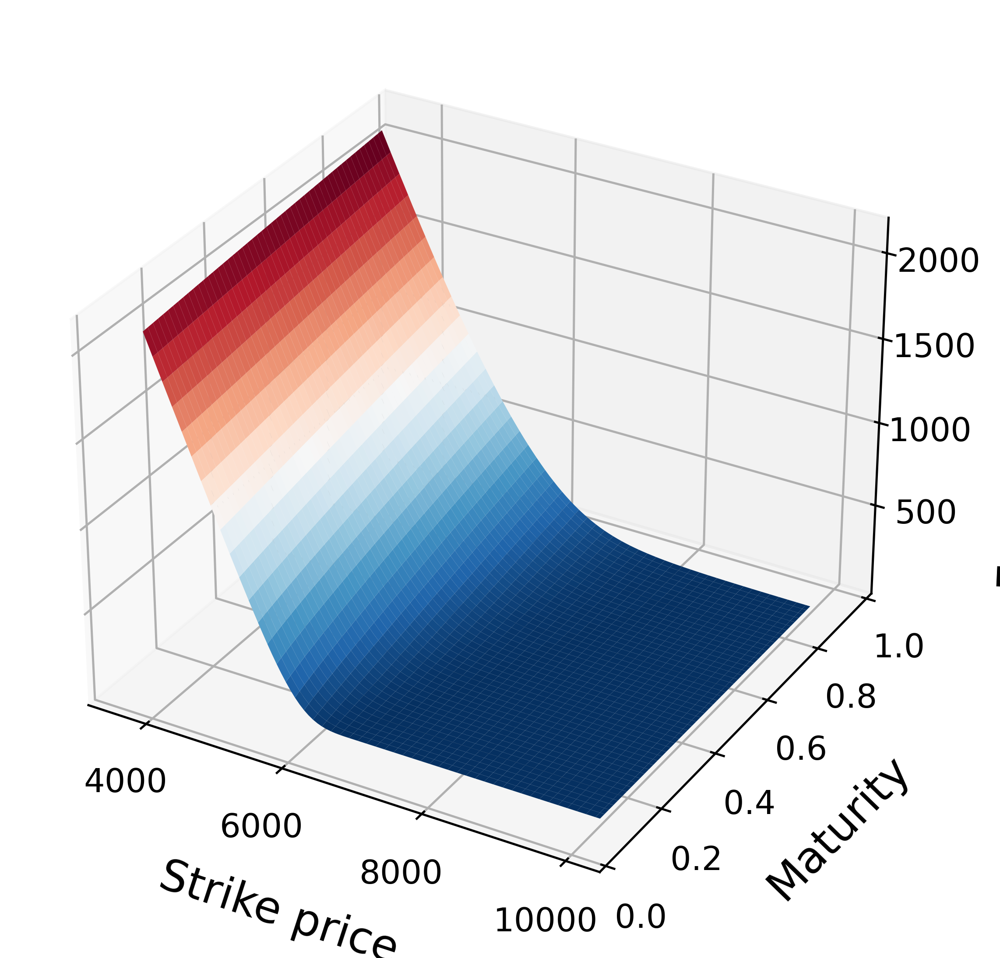

neural sigma


<Figure size 640x480 with 0 Axes>

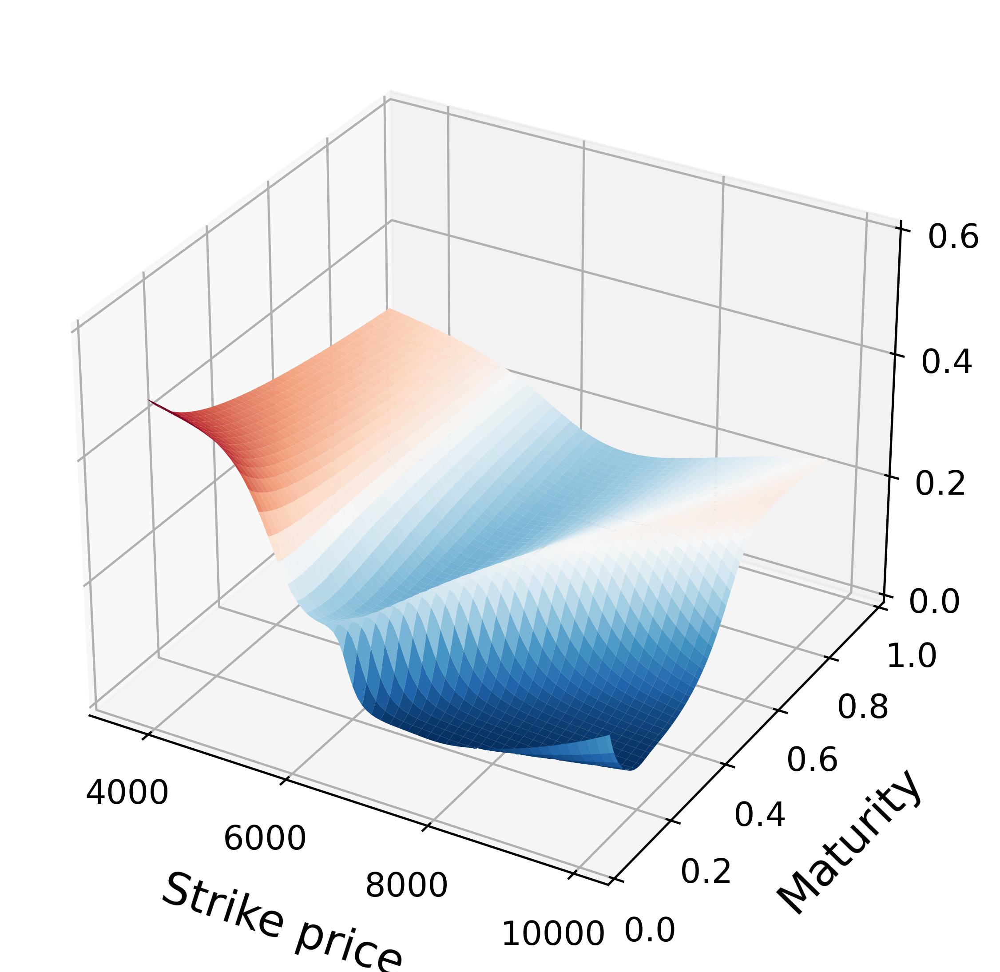

recovered phi from local volatility


<Figure size 640x480 with 0 Axes>

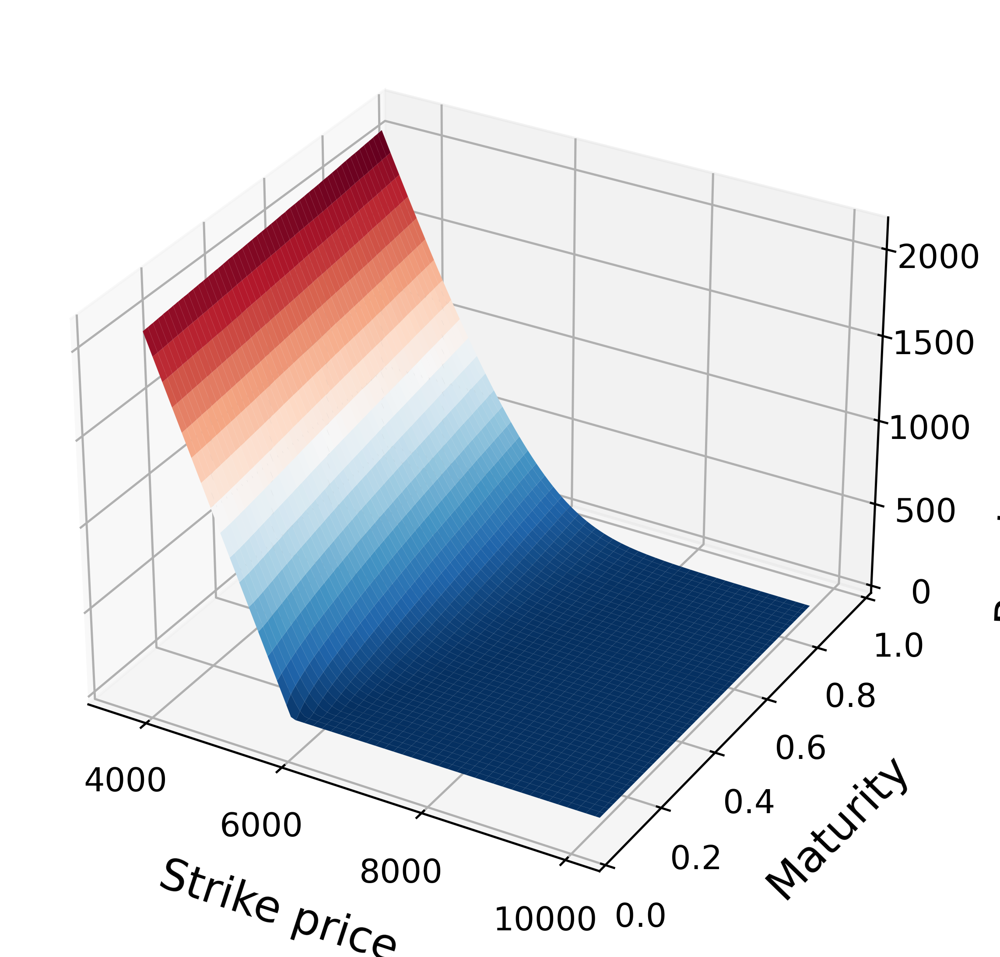

<Figure size 640x480 with 0 Axes>

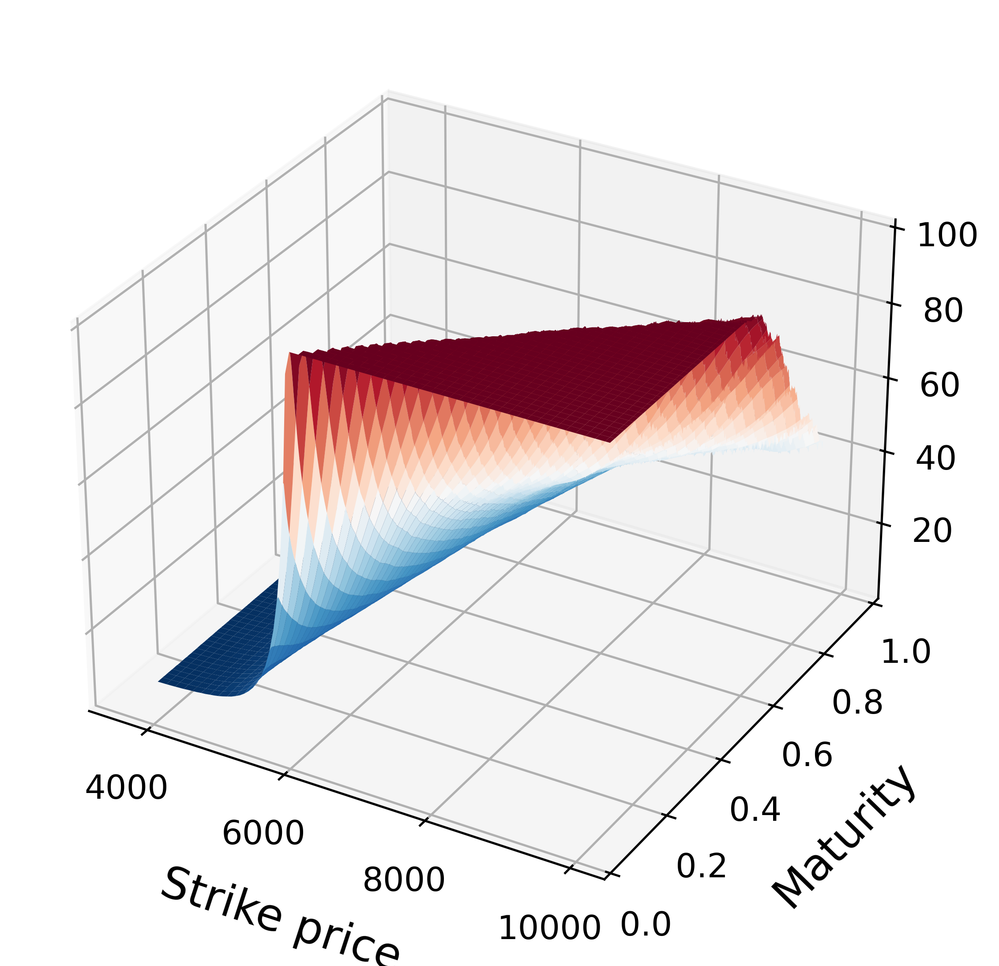

<Figure size 640x480 with 0 Axes>

In [ ]:
print(f'neural phi from curve fitting')

phi_fit_   = neural_phi(T_nn, K_nn)

fig = plt.figure(figsize=[8,6], dpi = 450)

ax1 = fig.add_subplot(111, projection='3d')
ax1.plot_surface(tf.reshape(K, [N,m]), tf.reshape(T, [N,m]), tf.reshape(phi_fit_, [N,m]), cmap = plt.cm.RdBu_r)
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='z', labelsize=12)
ax1.set_xlabel('Strike price', labelpad = 12, fontsize=16)
ax1.set_ylabel('Maturity', labelpad = 12, fontsize=16)
ax1.set_zlabel('Exact Option Price', labelpad = 12, fontsize=16)
ax1.set_ylim(0, 1)
plt.locator_params(nbins=5)
plt.show()
plt.savefig(os.path.join(dirname,f'phi_final.png'))

print(f'neural sigma')

fig = plt.figure(figsize=[8,6], dpi = 450)

sigma_nn_ = neural_sigma(T_nn, K_nn)

ax1 = fig.add_subplot(111, projection='3d')
ax1.plot_surface(tf.reshape(K, [N,m]), tf.reshape(T, [N,m]), tf.reshape(sigma_nn_, [N,m]), cmap = plt.cm.RdBu_r)
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='z', labelsize=12)
ax1.set_xlabel('Strike price', labelpad = 12, fontsize=16)
ax1.set_ylabel('Maturity', labelpad = 12, fontsize=16)
ax1.set_zlabel('Volatility', labelpad = 12, fontsize=16)
ax1.set_ylim(0, 1)
ax1.set_zlim(0, 0.6)
plt.locator_params(nbins=5)
plt.show()
plt.savefig(os.path.join(dirname,f'eta_final.png'))

print(f'recovered phi from local volatility')

phi_rec_ = tf.reshape(phi_cal(T,K), [-1,1])

fig = plt.figure(figsize=[8,6], dpi = 450)

ax1 = fig.add_subplot(111, projection='3d')
ax1.plot_surface(tf.reshape(K, [N,m]), tf.reshape(T, [N,m]), tf.reshape(phi_rec_, [N,m]), cmap = plt.cm.RdBu_r)
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='z', labelsize=12)
ax1.set_xlabel('Strike price', labelpad = 12, fontsize=16)
ax1.set_ylabel('Maturity', labelpad = 12, fontsize=16)
ax1.set_zlabel('Repriced Option Price', labelpad = 12, fontsize=16)
ax1.set_ylim(0, 1)
plt.locator_params(nbins=5)
plt.show()
plt.savefig(os.path.join(dirname,f'phi_rep_final.png'))

error_ = 100* (phi_fit_ - phi_rec_) / phi_fit_

fig = plt.figure(figsize=[8,6], dpi = 450)

ax1 = fig.add_subplot(111, projection='3d')
ax1.plot_surface(tf.reshape(K, [N,m]), tf.reshape(T, [N,m]), tf.reshape(error_, [N,m]), cmap = plt.cm.RdBu_r)
ax1.tick_params(axis='x', labelsize=12)
ax1.tick_params(axis='y', labelsize=12)
ax1.tick_params(axis='z', labelsize=12)
ax1.set_xlabel('Strike price', labelpad = 12, fontsize=16)
ax1.set_ylabel('Maturity', labelpad = 12, fontsize=16)
ax1.set_zlabel('Relative Error (%)', labelpad = 12, fontsize=16)
ax1.set_ylim(0, 1)
plt.locator_params(nbins=5)
plt.show()
plt.savefig(os.path.join(dirname,f'phi_error_final.png'))

In [ ]:
# repricing RMSE on the grid of the market option price

distinct_T = []

for i in range(len(T_ref)):
    if T_ref[i] not in distinct_T:
        distinct_T.append(T_ref[i])

ids_list = []
for T_i in distinct_T:
    ids,_ = np.where(T_ref == T_i)
    ids_list.append(ids)

K_list_ref = []

for ids_i in ids_list:
    K_i = tf.gather(K_ref, ids_i)
    K_list_ref.append(K_i)

S_list_ref = []

for T_i in distinct_T:
    S_i = S_matrix[int(T_i // dt)]
    S_list_ref.append(S_i)

phi_list_rec = []

for i in range(len(distinct_T)):
    phi_i = tf.exp(-r*distinct_T[i]) * tf.reduce_mean(tf.nn.relu(tf.reshape(S_list_ref[i], [-1,1]) - tf.reshape(K_list_ref[i], [1,-1])), axis=0, keepdims=True)

    phi_list_rec.append(phi_i)

phi_rec = tf.reshape(tf.concat(phi_list_rec, axis=1), [-1,1])

rmse_rec = tf.sqrt(tf.reduce_mean(tf.square(phi_rec - phi_ref)))

print(f'repricing rmse = {rmse_rec}')

repricing rmse = 3.1655004024505615


In [ ]:
with open(os.path.join(dirname, 'rmse.txt'), 'w') as f:
    f.write(f'Reprice RMSE: {rmse_rec}')